#### Emergency departments(EDs) are essential in any healthcare system because they deal with critical conditions that require urgent attention without an appointment. However, the EDs experience numerous challenges, including but not limited to overcrowding, long waiting times, lengthy time spent per visit or consultation, and varying outcomes. In this work, "Predictive Analytics to Optimize Ed's Operation," we process data from the National Hospital Ambulatory Medical Care Survey to develop predictive analytics solutions for better ED management and patient satisfaction improvement. By exploring patient demographics data, initial metrics, clinical signs, etc. This would consequently contribute to more effective Eds operation and better patient outcomes. This notebook presents the main steps of our exploratory analysis work. 

### Import libraries

In [2]:
import sys
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# Add project root to the Python path
from pathlib import Path
project_root = Path.cwd().parent.parent
sys.path.append(str(project_root))
from src.data_management.data_preprocessing_pipeline import DataPreprocessingPipeline

#### Load emergency_df

In [3]:
# Loading dataset
path = "/Users/jeancherizol/MADS/699/all_data"
path_models = "/Users/jeancherizol/MADS/699/SIADS/emergency-dept-optimization/models"
emergency_df = pd.read_sas(f"{path}/nhamcs14.sas7bdat")

#### Display the head of the dataframe emergency_df

In [4]:
emergency_df.head()

,VMONTH,VDAYR,ARRTIME,WAITTIME,LOV,AGE,AGER,AGEDAYS,RESIDNCE,SEX,...,RX30V3C1,RX30V3C2,RX30V3C3,RX30V3C4,SETTYPE,YEAR,CSTRATM,CPSUM,PATWT,EDWT
0,2.0,2.0,b'1603',130.0,157.0,63.0,4.0,-7.0,1.0,1.0,...,NaN,NaN,NaN,NaN,3.0,2014.0,20114201.0,100032.0,2184.0,NaN
1,2.0,2.0,b'1426',60.0,223.0,18.0,2.0,-7.0,1.0,1.0,...,NaN,NaN,NaN,NaN,3.0,2014.0,20114201.0,100032.0,2184.0,NaN
2,2.0,2.0,b'1719',20.0,164.0,58.0,4.0,-7.0,1.0,1.0,...,NaN,NaN,NaN,NaN,3.0,2014.0,20114201.0,100032.0,2184.0,NaN
3,2.0,3.0,b'1545',6.0,2708.0,71.0,5.0,-7.0,1.0,2.0,...,NaN,NaN,NaN,NaN,3.0,2014.0,20114201.0,100032.0,2184.0,NaN
4,2.0,3.0,b'1442',44.0,203.0,22.0,2.0,-7.0,1.0,1.0,...,NaN,NaN,NaN,NaN,3.0,2014.0,20114201.0,100032.0,2184.0,NaN


#### Describe the dataset dimensions and types of variables 

In [5]:
emergency_df.describe()

,VMONTH,VDAYR,WAITTIME,LOV,AGE,AGER,AGEDAYS,RESIDNCE,SEX,ETHUN,...,COMSTAT29,PRESCR30,CONTSUB30,COMSTAT30,SETTYPE,YEAR,CSTRATM,CPSUM,PATWT,EDWT
count,23844.000000,23844.000000,23844.000000,23844.00000,23844.000000,23844.000000,23844.000000,23844.000000,23844.000000,23844.000000,...,3.0,3.000000,3.0,3.000000,23844.0,23844.0,2.384400e+04,23844.000000,23844.000000,0.0
mean,6.335682,3.939272,32.536445,214.49719,37.233098,3.075994,-1.022647,0.830859,1.452063,-0.762959,...,1.0,2.333333,6.0,1.333333,3.0,2014.0,3.100994e+07,46348.330062,5931.071129,NaN
std,3.355561,1.975228,65.849860,334.10952,24.303367,1.491891,38.605132,1.519255,0.497707,4.632790,...,0.0,2.309401,0.0,0.577350,0.0,0.0,9.974010e+06,49917.234874,8242.150583,NaN
min,1.000000,1.000000,-9.000000,-9.00000,0.000000,1.000000,-7.000000,-9.000000,1.000000,-9.000000,...,1.0,1.000000,6.0,1.000000,3.0,2014.0,2.011420e+07,1.000000,22.000000,NaN
25%,3.000000,2.000000,3.000000,77.00000,19.000000,2.000000,-7.000000,1.000000,1.000000,1.000000,...,1.0,1.000000,6.0,1.000000,3.0,2014.0,2.031420e+07,21.000000,2275.000000,NaN
50%,6.000000,4.000000,15.000000,143.00000,34.000000,3.000000,-7.000000,1.000000,1.000000,2.000000,...,1.0,1.000000,6.0,1.000000,3.0,2014.0,4.010000e+07,39.000000,3739.000000,NaN
75%,9.000000,6.000000,39.000000,244.00000,55.000000,4.000000,-7.000000,1.000000,2.000000,2.000000,...,1.0,3.000000,6.0,1.500000,3.0,2014.0,4.030000e+07,100109.000000,6502.000000,NaN
max,12.000000,7.000000,1356.000000,5740.00000,93.000000,6.000000,364.000000,4.000000,2.000000,2.000000,...,1.0,5.000000,6.0,2.000000,3.0,2014.0,4.040000e+07,100261.000000,72062.000000,NaN


In [6]:
emergency_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23844 entries, 0 to 23843
Columns: 1012 entries, VMONTH to EDWT
dtypes: float64(445), object(567)
memory usage: 184.1+ MB


#### Plot the distribution of the two target variable WAITTIME and LOV side by side

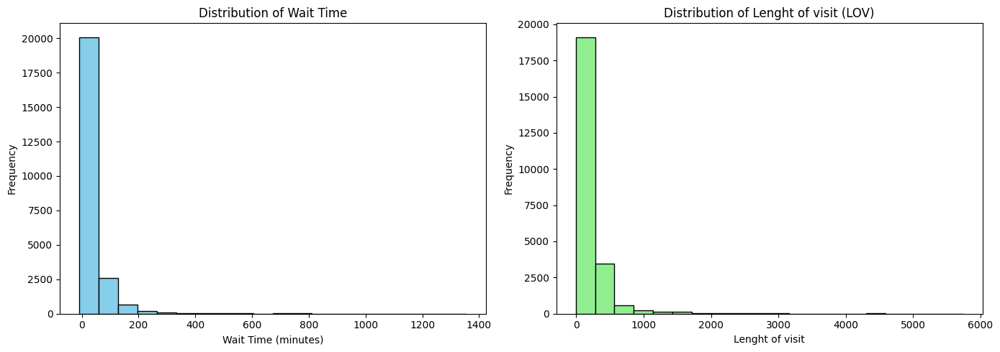

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram for WAITTIME
emergency_df['WAITTIME'].plot(kind='hist', bins=20, ax=axes[0], color='skyblue', edgecolor='black')
axes[0].set_title('Distribution of Wait Time')
axes[0].set_xlabel('Wait Time (minutes)')
axes[0].set_ylabel('Frequency')

# Bar chart for LOV
bin_counts, bin_edges = np.histogram(emergency_df['LOV'], bins=20)  # Adjust number of bins as necessary
axes[1].bar((bin_edges[:-1] + bin_edges[1:]) / 2, bin_counts, width=np.diff(bin_edges), edgecolor='black', color='lightgreen')
axes[1].set_title('Distribution of Lenght of visit (LOV)')
axes[1].set_xlabel('Lenght of visit')
axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

#### We created classes for data cleaning, feature engineering, data filtering, and data preprocessing. The data_cleaner and feature_engineering classes return a clean_emergency_df, which is a cleaned version of the messy original Emergency_df data frame. Via those classes, the messy emergency_df dataframe is transformed into a cleaned and organized version called clean_emergency_df.

In [9]:
target = 'WAITTIME'
target_to_drop = ['LOV_BINARY']
        
# Instantiate the data preprocessing pipeline
cleaned_df = DataPreprocessingPipeline(emergency_df=emergency_df,target=target,target_to_drop=target_to_drop,percent_train=0.70,percent_val=0.15,percent_test=0.15,path=path,stratify=False)
# Run the pipeline
cleaned_df.run_clean_data()
cleaned_emergency_df = cleaned_df.cleaned_emergency_df # cleaned_emergency_df is the cleaned version of emergency_df


Data cleaning completed
Size of Initial dataset:(23844, 1012)
Size of cleaned dataset:(18227, 371)



#### Let's see the distribution for the target variables WAITTIME and LOV after dealing with outliers. PS: The data_cleaner class has the method that implements _remove_outliers 

In [10]:
cleaned_emergency_df[['WAITTIME','LOV']].describe()

,WAITTIME,LOV
count,18227.000000,17878.000000
mean,25.745049,211.987079
std,23.541536,292.856728
min,0.000000,0.000000
25%,8.000000,87.000000
50%,18.000000,146.000000
75%,37.000000,239.000000
max,101.000000,5605.000000


#### Now, we will use cleaned_emergency_df which does some cleaning. It inludes remove outliers for both target variables, WAIT TIME and LOVE. The data cleaner class contains a method that allows the remove_outliers method. data_cleaner class is located in /emergency-dept-optimization/src/data_management/data_cleaner.py. 

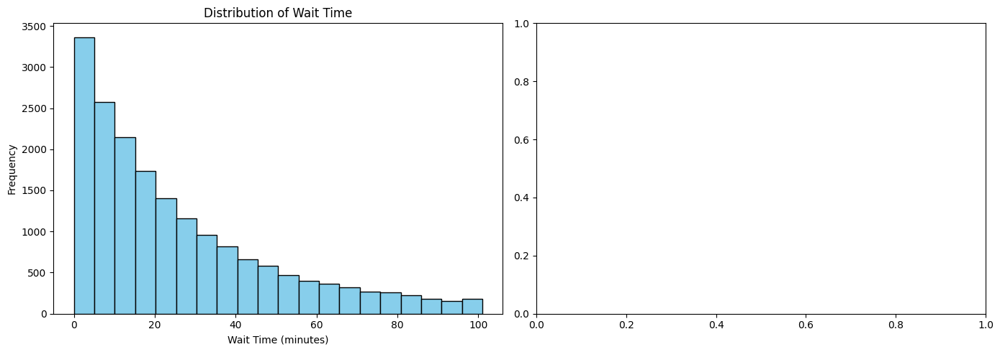

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram for cleaned WAITTIME
cleaned_emergency_df['WAITTIME'].plot(kind='hist', bins=20, ax=axes[0], color='skyblue', edgecolor='black')
axes[0].set_title('Distribution of Wait Time')
axes[0].set_xlabel('Wait Time (minutes)')
axes[0].set_ylabel('Frequency')

# Histogram for cleaned LOV(length of visit)
# bin_counts, bin_edges = np.histogram(cleaned_emergency_df['LOV'], bins=20)  # Adjust number of bins as necessary
# axes[1].bar((bin_edges[:-1] + bin_edges[1:]) / 2, bin_counts, width=np.diff(bin_edges), edgecolor='black', color='lightgreen')
# axes[1].set_title('Distribution of Lenght of visit (LOV)')
# axes[1].set_xlabel('Lenght of visit')
# axes[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [13]:
cleaned_emergency_df['HOSPCODE'].value_counts()

HOSPCODE
2      259
149    191
244    151
229    144
98     141
      ... 
266      2
24       2
227      1
190      1
118      1
Name: count, Length: 253, dtype: int64

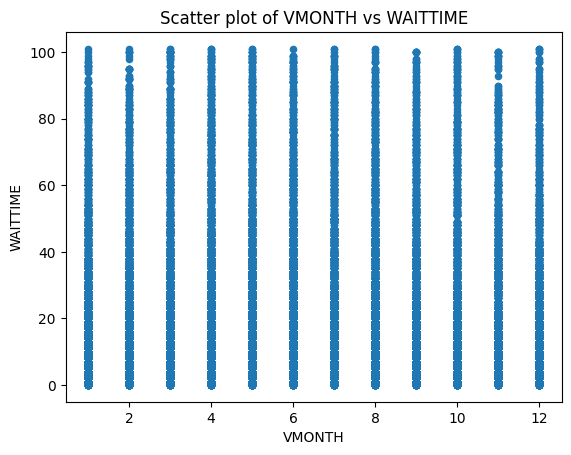

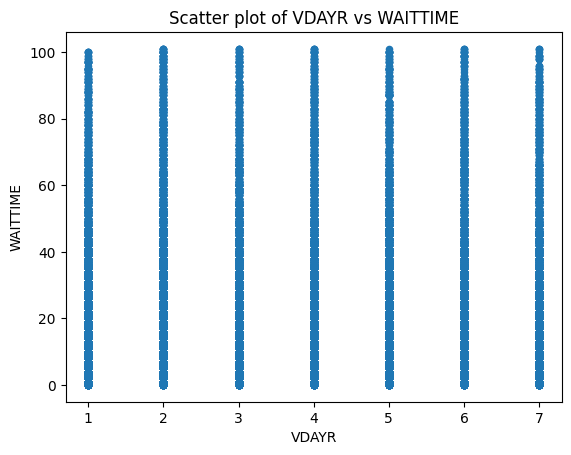

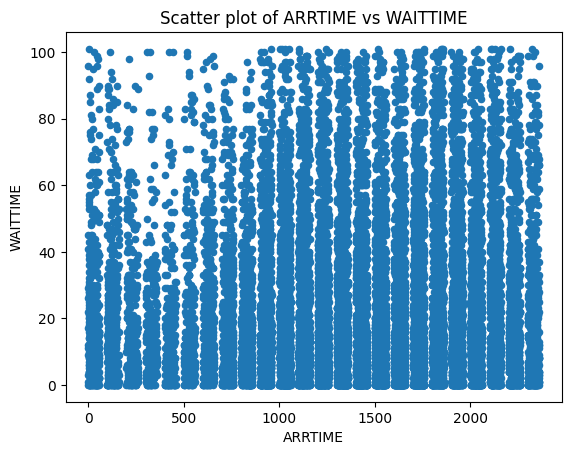

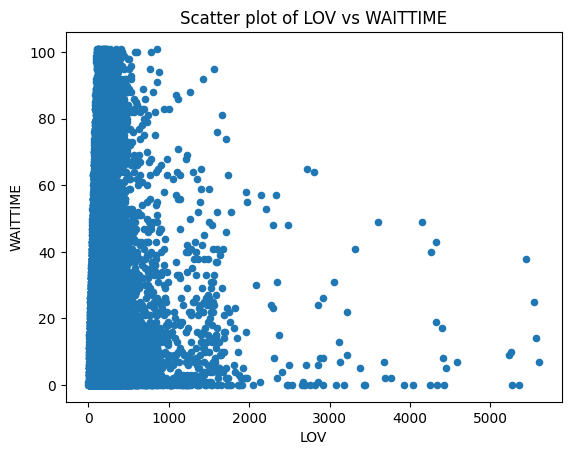

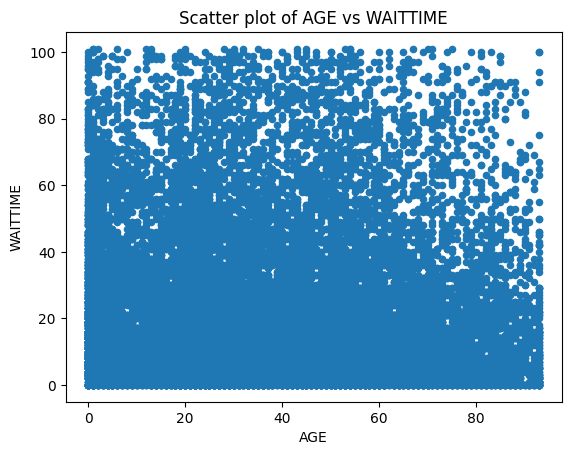

...

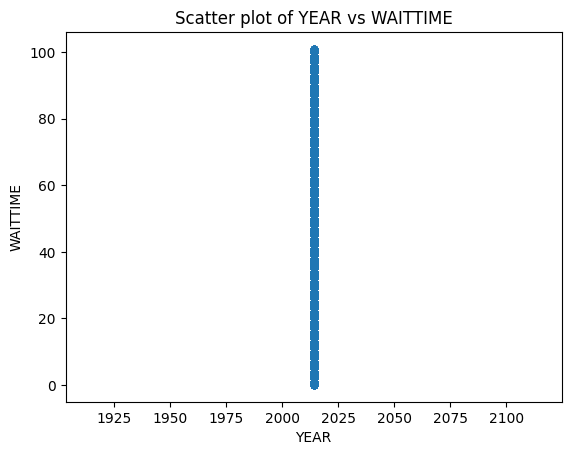

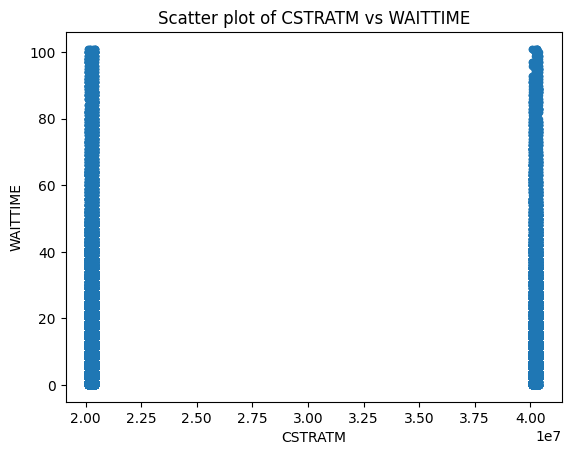

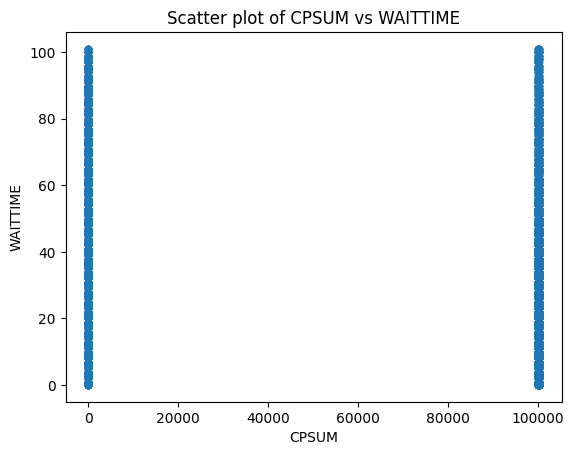

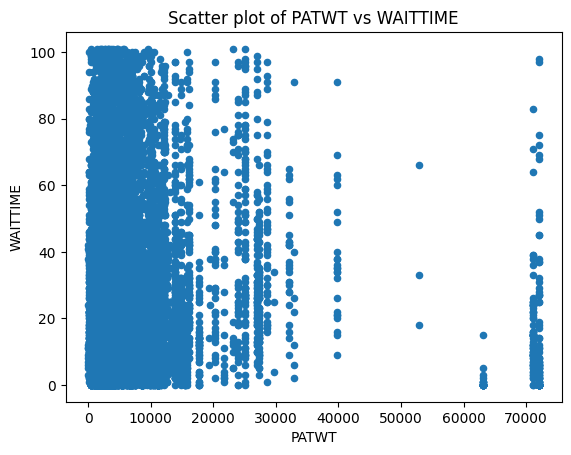

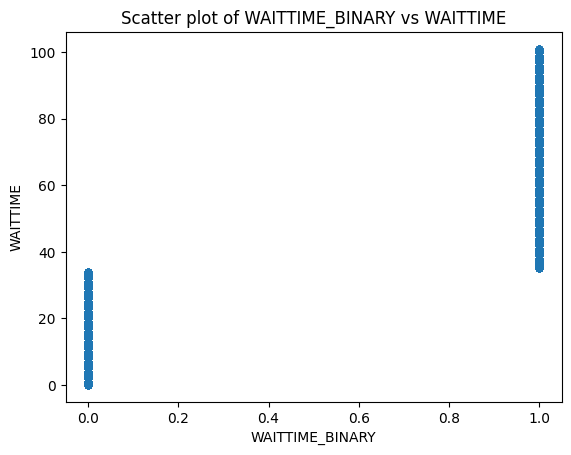

In [14]:
numerical_columns = cleaned_emergency_df.select_dtypes(include=['number']).columns.drop('WAITTIME')

for column in numerical_columns:
    cleaned_emergency_df.plot(kind='scatter', x=column, y='WAITTIME')
    plt.title(f'Scatter plot of {column} vs WAITTIME')
    plt.show()

In [16]:
cleaned_emergency_df['MSA'].value_counts()

MSA
1    13614
2     3294
Name: count, dtype: int64